# Homework 2 - Programming

There are two main tasks in this programming assignment are to implement the **eight-point algorithm** and **four-point algorithm**. 

In [103]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import utils

## Remarks before starting
Please take note of the following few things:

1. In your `hw2_progrmming` folder, there are two subfolders, namely `four_point` and `eight_point`. In each folder, there are four pairs of scenes (8 images in total) and a `numpy` file, which contains the numpy array of coordinate correspondences. Each image has dimensions (512, 512). For eight-point algorithm, you have 10 points for each pair of scene. For four-point algorithm, you have 6 points for each pair of scene. 
2. coordinate correspondences are given to you as a numpy array, with dimensions (4, 2, 10, 2) for eight-point and (4, 2, 6, 2) for four-point. The dimensions correspond to `(num_scenes, camera angle, num_pts, pixel_coordinates)`. I highly encourage you to print out the array to get a better sense of the x, y, and z axis. 
3. To transform pixel coordinates to Euclidean system, you will need the intrinsic matrix. In our synthetic dataset, the intrinsic matrix `K` is the same for all scenes and camera angles. 
4. Some helpful functions are implemented in `utils.py`. I encourage you to take a look before starting. 

In [104]:
K = np.array([[ 560    ,  0.        ,  0.        ],  # intrinsic matrix
              [ 0.        ,  560    ,  0.        ],
              [ 0.        ,  0.        ,  1.        ]])

## Eight Point Algorithm

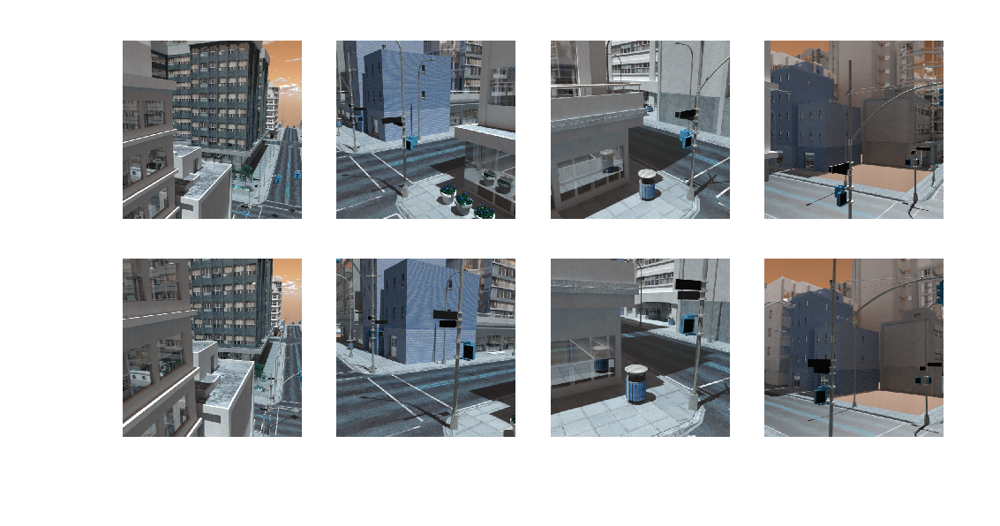

In [105]:
# data loading
folder = "./eight_point/"
img_arr = utils.load_scenes(folder)
utils.plot_scenes(img_arr)

In [106]:
# read correspondences
corr_8 = np.load(os.path.join(folder, 'eight_pt_corr.npy'))

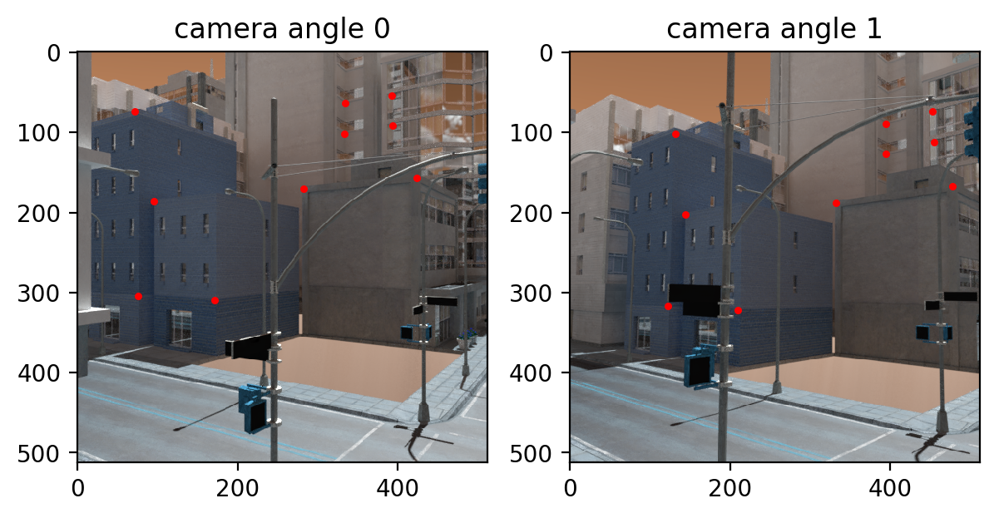

In [107]:
scene_id = 3 # change this to view other scenes
utils.plot_correspondences(img_arr, corr_8, scene_id)

In [108]:
def hat(x):
    x.reshape(3,1)

    return np.array([[0,-x[2],x[1]],[x[2],0,-x[0]],[-x[1],x[0],0]])


In [109]:
def show_projection(img_arr,scene_id,corr,R,T):
    x1=corr[0]
    x2=corr[1]
    x1=x1/560
    x2=x2/560
    x1[:,[0,1]]=x1[:,[1,0]]
    x2[:,[0,1]]=x2[:,[1,0]]
    X1=np.append(x1[0],1)
    X2=np.append(x2[0],1)
    l= x1.shape[0]
    X_projection = np.zeros([l,2])
   
    for i in range(l):
        X1=np.append(x1[i],1)
        X2=np.append(x2[i],1)
        lambda1=np.linalg.norm(hat(X2)@T)/np.linalg.norm(hat(X2)@R@X1)
        lambda2=np.linalg.norm((hat(R@X1)@T))/np.linalg.norm((hat(R@X1)@X2))
#         print(lambda1,lambda2)
        projection = (lambda1*R.dot(X1).transpose()+T[:,0])
        projection_xy = projection[:2]/projection[2]
        X_projection[i]=projection_xy
        
    im_i = scene_id # image index 0-9 (please change this to see other scenes)
    fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(7, 5), dpi=200)
    ax.imshow(img_arr[im_i, 1])
    ax.scatter(x2[:,0]*560, x2[:,1]*560, c='r', s=5)
    ax.scatter(X_projection[:,0]*560, X_projection[:,1]*560, c='g', s=5)
    ax.set_title('projection image')
    plt.show() 
        

**TASK1**: Implement the eight-point algorithm below. 

In [110]:
def eight_point_algorithm(corr):
    A=np.zeros((10,9))
    x1=corr[0]
    x2=corr[1]
    x1=x1/560
    x2=x2/560
    x1[:,[0,1]]=x1[:,[1,0]]
    x2[:,[0,1]]=x2[:,[1,0]]
    X1=np.append(x1[1],1)
    X2=np.append(x2[1],1)
   
    for i in range(10):
        A[i]=[x1[i,0]*x2[i,0], x1[i,0]*x2[i,1], x1[i,0],
                x1[i,1]*x2[i,0], x1[i,1]*x2[i,1], x1[i,1],
                x2[i,0], x2[i,1], 1 ]
    U,S,Vh=np.linalg.svd(A)
   
    E0 = (Vh[-1].reshape(3,3)).T
    U1,S1,V1=np.linalg.svd(E0)
    S1_n=np.diag([1,1,0])
#     print(U1,V1)
    
    R_z1=np.array([[0,1,0],[-1,0,0],[0,0,1]])
    R_z2=np.array([[0,-1,0],[1,0,0],[0,0,1]])
    R_z=[R_z1,R_z2]
    
    for R_z_R in R_z:
        for R_z_T in R_z:
            T_hat=U1@R_z_R@S1_n@U1.T
            
            R_=U1@R_z_T.T@V1
            T_=np.array([[T_hat[2,1]],[-T_hat[2,0]],[T_hat[1,0]]])
            if hat(T_)@X2@hat(T_)@R_@(X1)>0 and hat(X2)@R_@X1@hat(X2)@T_<=0 and hat(R_@X1)@X2@hat(R_@X1)@T_ > 0:
                print(1)
                T=T_
                R=R_
    
    return R, T

1
-------the  0  scene-------
R=  [[ 0.99779655  0.04461881 -0.04910408]
 [-0.04658278  0.99812896 -0.03960581]
 [ 0.04724504  0.04180594  0.9980081 ]]
T=  [[ 0.02509766]
 [-0.54297109]
 [-0.83937626]]


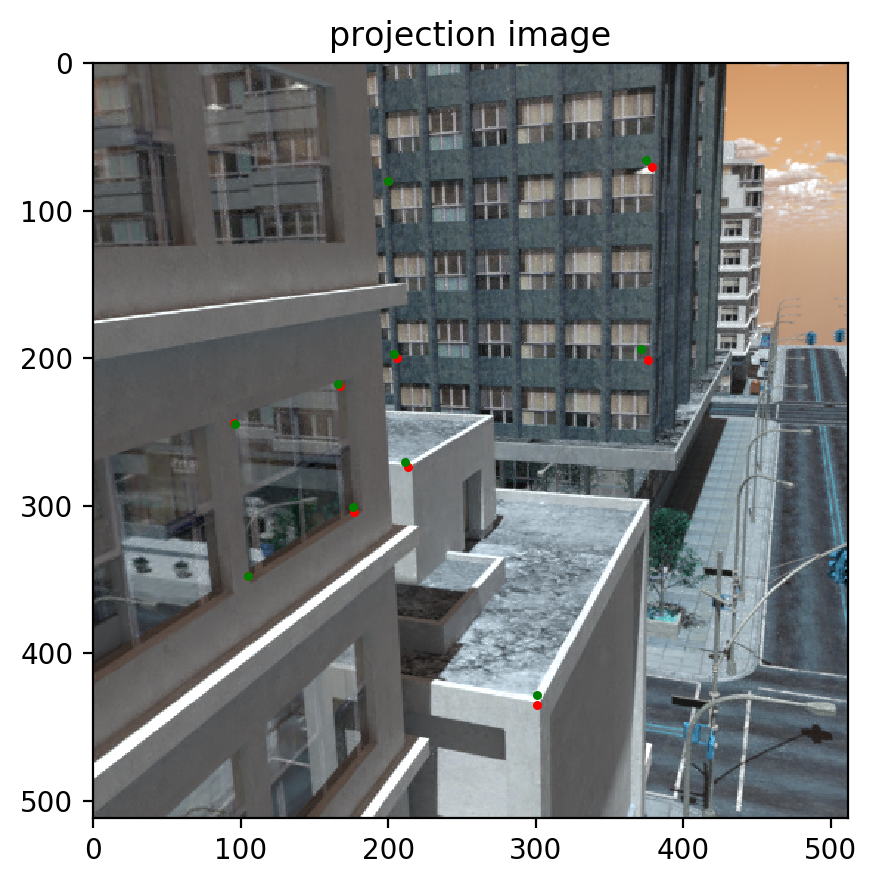

1
-------the  1  scene-------
R=  [[ 0.9680949   0.18454003  0.16952062]
 [ 0.18182695 -0.05181827 -0.98196427]
 [ 0.17242745 -0.98145802  0.08371936]]
T=  [[-0.09778531]
 [ 0.7692337 ]
 [ 0.63144085]]


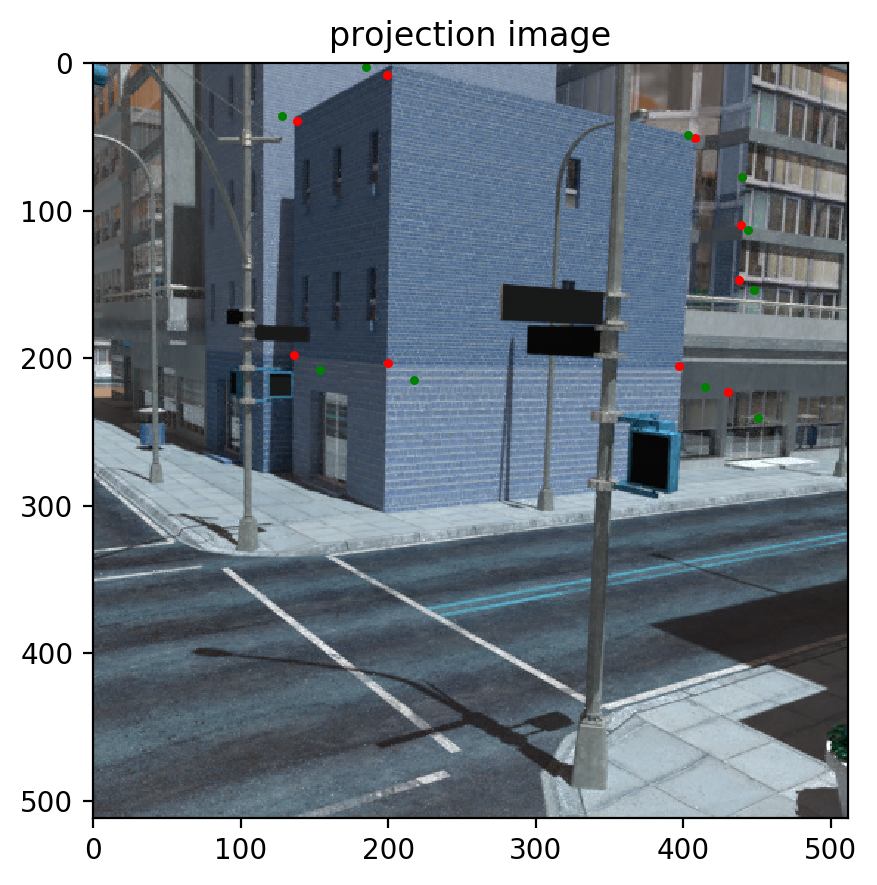

1
-------the  2  scene-------
R=  [[ 9.93715411e-01 -1.52990123e-04  1.11935957e-01]
 [ 4.40758834e-03  9.99277013e-01 -3.77627443e-02]
 [-1.11849252e-01  3.80187886e-02  9.92997642e-01]]
T=  [[-0.65092598]
 [-0.57913732]
 [-0.49081089]]


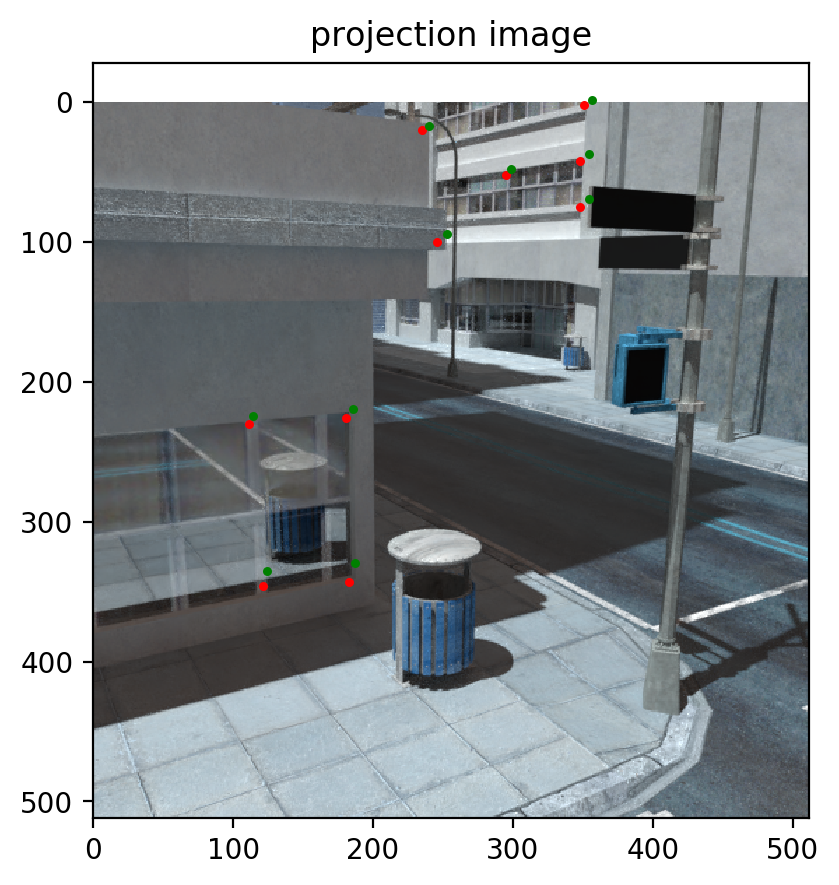

1
-------the  3  scene-------
R=  [[ 0.99482124 -0.0316777   0.09657751]
 [ 0.0272283   0.99852156  0.04704596]
 [-0.09792503 -0.04417268  0.99421299]]
T=  [[-0.78679387]
 [-0.58384873]
 [-0.20019009]]


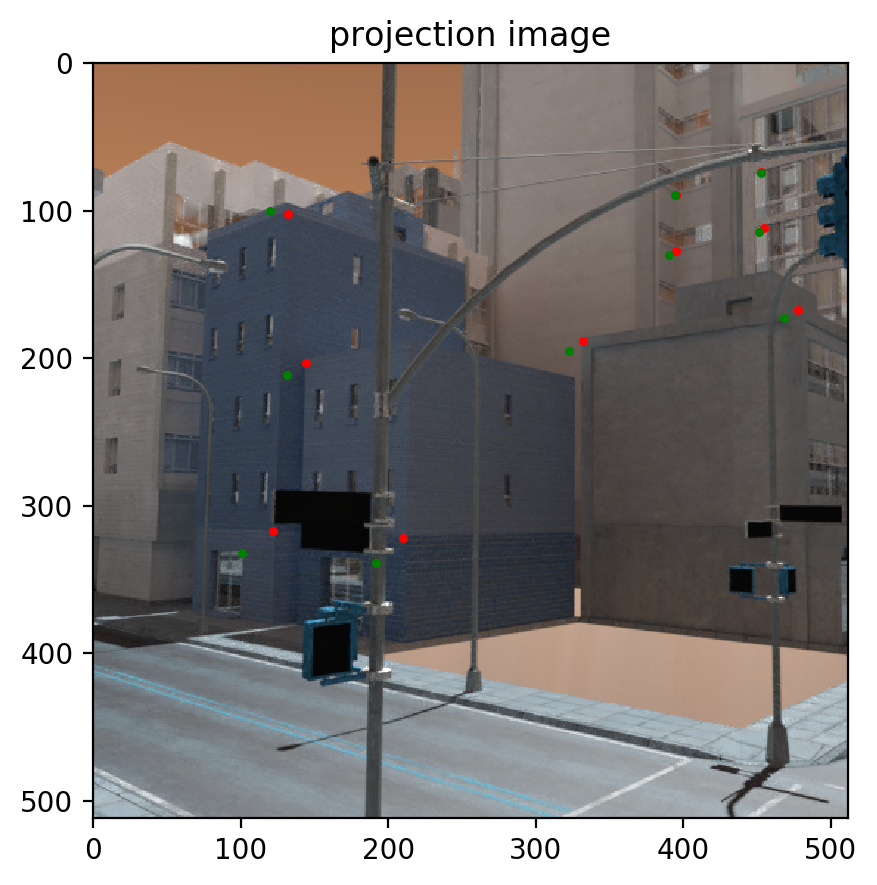

In [111]:
for i in range(4):
    R,T=eight_point_algorithm(corr_8[i])
    print("-------the ",i," scene-------")
    print("R= ",R)
    print("T= ",T)
    show_projection(img_arr,i,corr_8[i],R,T)

## Four-point Algorithm

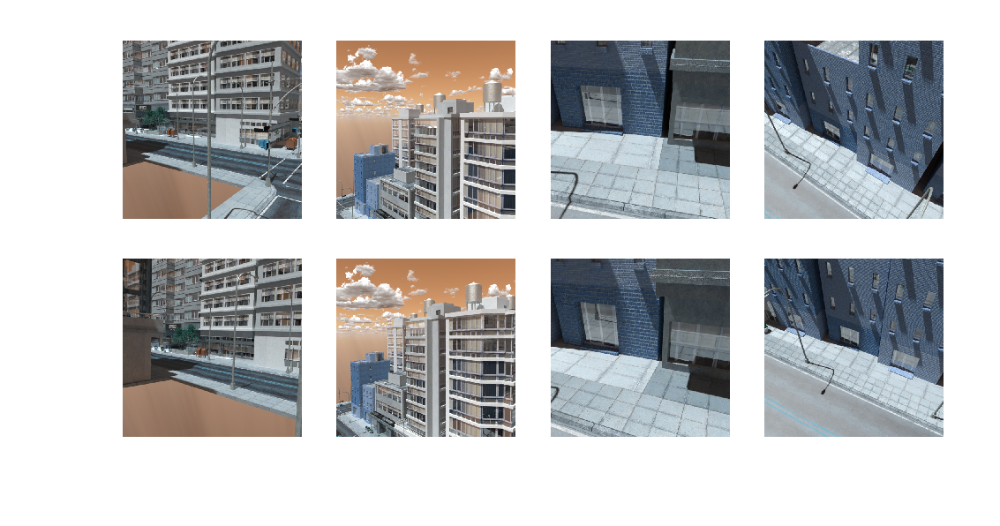

In [112]:
# data loading
folder = "./four_point/"
img_arr = utils.load_scenes(folder)
utils.plot_scenes(img_arr)

In [113]:
# read correspondences
corr = np.load(os.path.join(folder,'four_pt_corr.npy'))

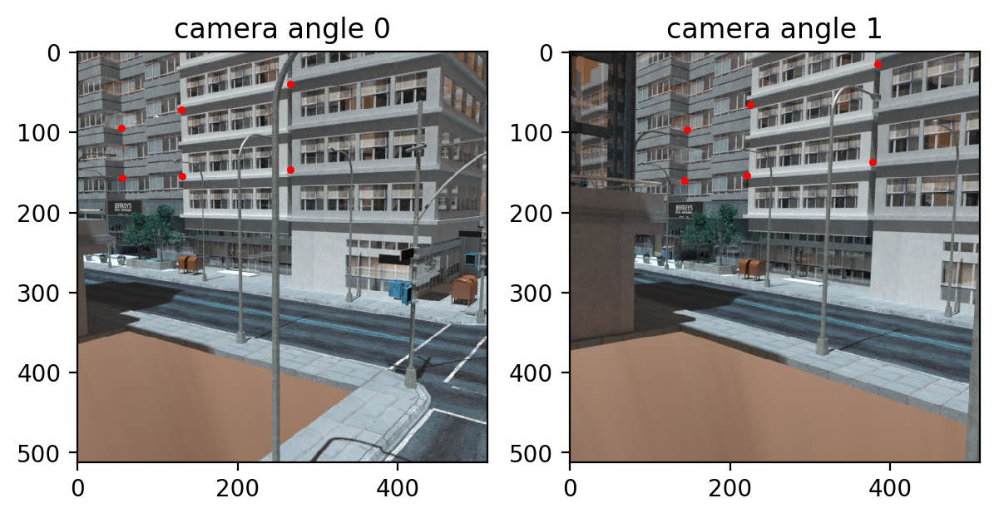

In [114]:
# plotting correspondences
scene_id = 0
utils.plot_correspondences(img_arr, corr, scene_id)

**TASK2**: Implement the four-point algorithm below

In [115]:
def four_point_algorithm(corr):
    A=np.zeros((18,9))
    x1=corr[0]/560
    x2=corr[1]/560
    x1[:,[0,1]]=x1[:,[1,0]]
    x2[:,[0,1]]=x2[:,[1,0]]
    X1=np.append(x1[0],1)
    X2=np.append(x2[0],1)
    for i in range(6):
        X1_=np.append(x1[i],1)
        X2_=np.append(x2[i],1)
        A[3*i:3*i+3]=np.kron(X1_,hat(X2_))
    U,S,V=np.linalg.svd(A)
    HL = (V[-1].reshape(3,3)).T
    U_,S_,V_=np.linalg.svd(HL)
    H=HL/S_[1]
   
    U_2,S_2,V_2=np.linalg.svd(H)
    v1=(V_2[[0]]).transpose()
    v2=(V_2[[1]]).transpose()
    v3=(V_2[[2]]).transpose()
    u1=(np.sqrt(1-S_2[2]**2)*v1+np.sqrt(S_2[0]**2 -1)*v3)/np.sqrt(S_2[0]**2-S_2[2]**2)
    u2=(np.sqrt(1-S_2[2]**2)*v1-np.sqrt(S_2[0]**2 -1)*v3)/np.sqrt(S_2[0]**2-S_2[2]**2)
    U1=np.concatenate((v2,u1,hat(v2[:,0])@u1),axis=1)
    W1=np.concatenate(((H@v2),H@u1,(hat(H@v2[:,0]))@H@u1),axis=1)
    U2=np.concatenate((v2,u2,hat(v2[:,0])@u2),axis=1)
    W2=np.concatenate((H@v2,H@u2,(hat(H@v2[:,0]))@H@u2),axis=1)
    
    R=[]
    N=[]
    T_d=[]
    R1=W1@(U1.T)
    N1=hat(v2[:,0])@u1
    T1_d=(H-R1)@N1
    if N1[2,0]>0:
        R.append(R1)
        N.append(N1)
        T_d.append(T1_d)
    R2=W2@(U2.T)
    N2=hat(v2[:,0])@u2
    T2_d=(H-R2)@N2
    if N2[2,0]>0:
        R.append(R2)
        N.append(N2)
        T_d.append(T2_d)
    R3=R1
    N3=-N1
    T3_d=-T1_d
    if N3[2,0]>0:
        R.append(R3)
        N.append(N3)
        T_d.append(T3_d)
    R4=R2
    N4=-N2
    T4_d=-T2_d
    if N4[2,0]>0:
        R.append(R4)
        N.append(N4)
        T_d.append(T4_d)
    

    return (R[0],N[0], T_d[0]),(R[1],N[1],T_d[1])

-------the  0  scene---------
R1= [[ 0.88993085  0.43406773 -0.1400296 ]
 [ 0.43746791 -0.89920567 -0.00714122]
 [-0.12901519 -0.05490326 -0.99012156]]
N1= [[0.97891639]
 [0.20342326]
 [0.01848483]]
T_d1= [[-1.80401811]
 [-0.31991201]
 [ 0.40708928]]
R2= [[-0.55368921  0.76379674  0.33172699]
 [ 0.62507257  0.11801224  0.77159406]
 [ 0.55019318  0.63457675 -0.5427705 ]]
N2= [[0.35079876]
 [0.75816553]
 [0.54965922]]
T_d2= [[-0.91893949]
 [-1.42751867]
 [-0.80017959]]


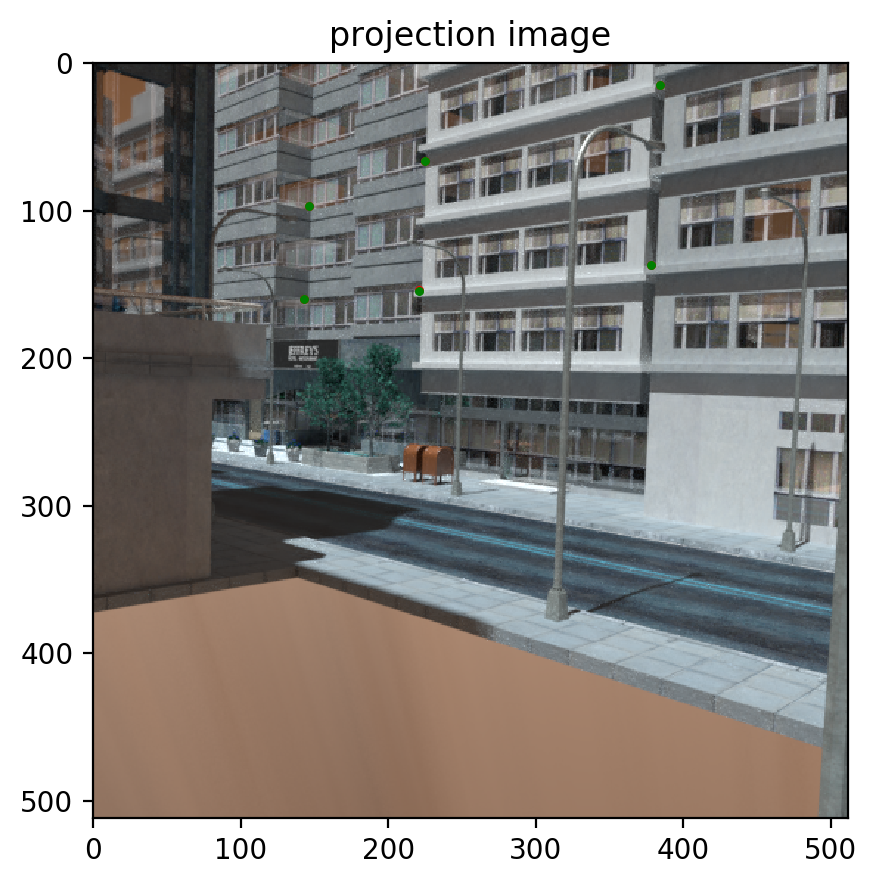

-------the  1  scene---------
R1= [[-0.13721272  0.12362102  0.98279729]
 [ 0.16072277 -0.97625524  0.14523736]
 [ 0.9774154   0.17788632  0.11408593]]
N1= [[0.66329863]
 [0.0827461 ]
 [0.7437661 ]]
T_d1= [[-1.31010596]
 [-0.16798988]
 [-1.60653868]]
R2= [[-0.99130141 -0.0762133   0.10729892]
 [-0.1034029  -0.05335842 -0.99320729]
 [ 0.0814209  -0.9956628   0.0450136 ]]
N2= [[ 0.10996909]
 [-0.67465588]
 [ 0.72989467]]
T_d2= [[-0.13551822]
 [ 1.38855578]
 [-1.54243717]]


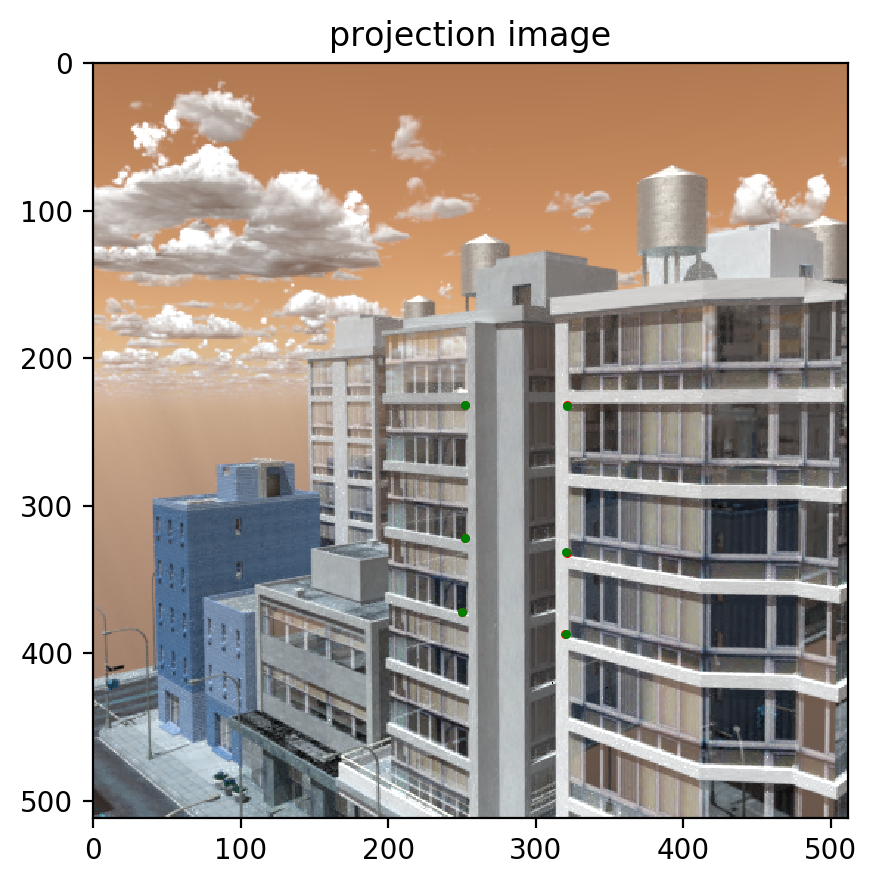

-------the  2  scene---------
R1= [[ 0.09749737 -0.30741897  0.94656634]
 [-0.26692454 -0.92432903 -0.27270337]
 [ 0.95877294 -0.22607392 -0.17217731]]
N1= [[ 0.69042426]
 [-0.20766511]
 [ 0.6929571 ]]
T_d1= [[-1.37280497]
 [ 0.40962217]
 [-1.2087505 ]]
R2= [[ 0.8961952   0.42206037 -0.13674508]
 [ 0.42352282 -0.90567196 -0.01966524]
 [-0.1321461  -0.04029077 -0.99041106]]
N2= [[-0.96653016]
 [-0.24593067]
 [ 0.07305855]]
T_d2= [[ 1.80699554]
 [ 0.42175018]
 [-0.26524611]]


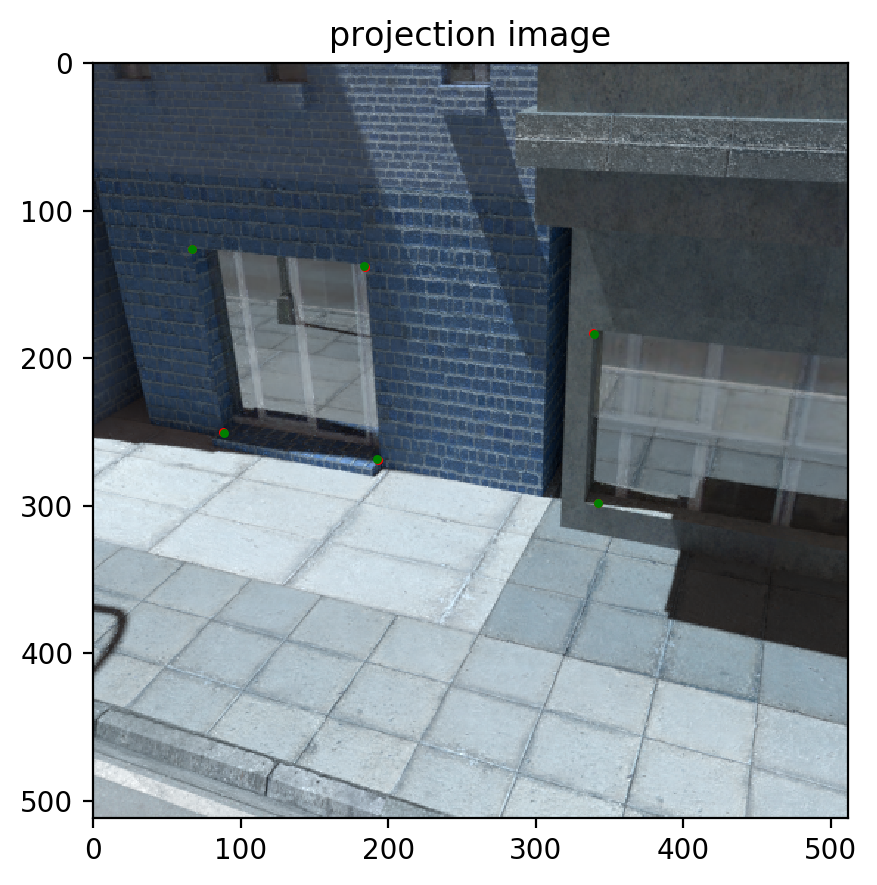

-------the  3  scene---------
R1= [[-0.10279203 -0.60993595  0.78575564]
 [-0.60758152 -0.58695214 -0.53509988]
 [ 0.78757761 -0.53241461 -0.31025181]]
N1= [[ 0.72648994]
 [-0.46955228]
 [ 0.50173003]]
T_d1= [[-1.70315149]
 [ 1.14951854]
 [-1.35146439]]
R2= [[ 0.52730192 -0.84117034 -0.11993812]
 [-0.84057167 -0.53703826  0.0709166 ]
 [-0.1240643   0.06342213 -0.99024526]]
N2= [[-0.8751961 ]
 [ 0.4831735 ]
 [ 0.02398239]]
T_d2= [[ 2.13371194]
 [-1.22041655]
 [ 0.08019158]]


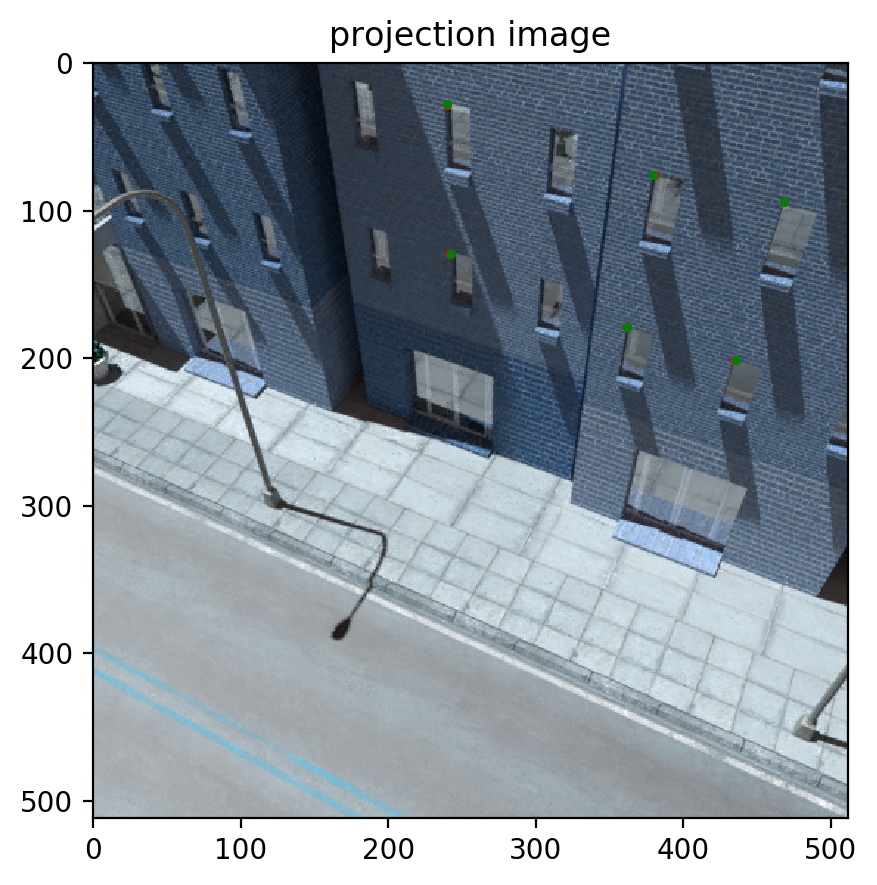

In [116]:
for i in range(4):
    (R1,N1,T_d1),(R2,N2,T_d2)=four_point_algorithm(corr[i])
    print("-------the ",i," scene---------")
    print("R1=",R1)
    print("N1=",N1)
    print("T_d1=",T_d1)
    
    print("R2=",R2)
    print("N2=",N2)
    print("T_d2=",T_d2)
    show_projection(img_arr,i,corr[i],R1,T_d1)

End of Assignment